In [4]:
base = 13520 # The old run to use for reference
run = "E1071" # Your new run

# compare Run 7 results with Run 6a and 6b

## Library and function imports

In [5]:
import os
import numpy as np
import pandas as pd
import scipy as sp
import sys
sys.path.append('/home/s/seanmacb/Camera/pkgs')
sys.path.append('/home/s/seanmacb/Camera/pkgs/eo_pipe/python/lsst/eo/pipe')
import eo_pipe.python.lsst.eo.pipe as eo_pipe
from eo_pipe.python.lsst.eo.pipe import (readNoiseTask, darkCurrentTask, defectsTask, eperTask, divisaderoTearingTask, ptcPlotsTask,linearityPlotsTask, bfAnalysisTask)
import copy
import lsst.daf.butler as daf_butler
import lsst.afw.math as afw_math
from matplotlib import pyplot as plt
from matplotlib import lines
from mpl_toolkits import axes_grid1
from astropy.stats import sigma_clip
from scipy.stats import skew
from tabulate import tabulate
from scipy.stats import norm

from lsst.obs.lsst import LsstCam, LsstTS8
from IPython.display import display_html, HTML
import myutils_ar.myutils as myu

def get_run_data(acq_run,weekly='w_2023_24',operator='lsstccs',repo='/repo/ir2',verbose=0):
    
    # We use the collection naming scheme to find all of the chained collections for an eo_pipe analysis of 
    # the specified run.  For our dataset queries, we'll use these collections.
    butler = daf_butler.Butler(repo)
    collections = butler.registry.queryCollections(f"u/{operator}/eo_*_{acq_run}_{weekly}",
                                               collectionTypes=daf_butler.CollectionType.CHAINED)
    if verbose>0:
        for item in collections:
            print(item)
            
    # Several eo_pipe pipelines produce per-amp measurements for all of the CCDs in the current Camera object.
    # For LSSTCam, this would include all 205 CCDs in the focal plane; for TS8, this would be the 9 CCDs in 
    # the raft installed at that test stand (currently RTM-004).
    #
    # The `eo_pipe.get_amp_data` function will retrieve these per-amp measurements and return them as a 
    # three-level dictionary, keyed by measurement quantity, CCD (labeled by R**_S for LSSTCam), and 
    # amplifier data (labeled by channel name, e.g., 'C01').
    #
    # The '[ps]cti' quantities are measured from combined flats, so will have different values depending on the
    # filter used, since combined flats a created separately for each filter combination.
    amp_data = eo_pipe.get_amp_data(repo, collections)
    if verbose>0:
        for quantity in amp_data.keys():
            print(quantity)
            
    df_data = myu.eopipe_DictToDfz(amp_data)
    if verbose>0:
        print(df_data.columns)
        
    return amp_data,df_data


def fitGaussian(data,ax):
    mu, std = norm.fit(data) 
    
    xmin, xmax = ax.get_xlim()
    x = np.linspace(np.floor(xmin), np.ceil(xmax), int(10E4))
    p = norm.pdf(x, mu, std)

    return mu,std,p,x,xmin,xmax

def getFWHM_from_gaussian(sigma):
    return 2*np.sqrt(np.log(2)*2)*sigma

def compare_tworuns(df1,df2,run1,run2,minxy,maxxy,quantity='READ_NOISE',draw_line=True,legend_loc='lower right',title=None, scale='linear'):

    rtms = myu.get_rtms()
    crtms = myu.get_crtms()
    rtmids = myu.get_rtmids()
    allrtms = rtms + crtms

    f,ax = plt.subplots(5,5,figsize=(22,22),constrained_layout=True)
    axf = ax

    for i,abay in enumerate(allrtms):

        thertm = rtmids[abay]
        ix = 4-int(abay[1:2])
        iy = int(abay[2:3])

        # get the desired quantity, filtered by raft
        df1f = df1[df1.BAY==abay]
        df2f = df2[df2.BAY==abay]

        for aslot in myu.get_slots_per_bay(abay):

            # filter by slot
            df1fs = df1f[df1f.SLOT==aslot]
            df2fs = df2f[df2f.SLOT==aslot]

            quant1 = df1fs[quantity]
            quant2 = df2fs[quantity]

            # make sure we have entries
            if len(quant1)>0 and len(quant1)==len(quant2):
                axf[ix,iy].scatter(quant1,quant2,label=aslot)


        axf[ix,iy].text(0.07,0.9,'%s %s' % (abay,thertm),transform=axf[ix,iy].transAxes)
        axf[ix,iy].set_xlabel('%s Run %s' % (quantity,run1))
        axf[ix,iy].set_ylabel('%s Run %s' % (quantity,run2))

        axf[ix,iy].set_xlim(minxy,maxxy)
        axf[ix,iy].set_ylim(minxy,maxxy)

        ax[ix,iy].set_xscale(scale)
        ax[ix,iy].set_yscale(scale)

        if (ix==0 and iy==0) or (ix==0 and iy==1):
            axf[ix,iy].legend(loc=legend_loc)

        if draw_line:
            line = lines.Line2D([minxy,maxxy], [minxy,maxxy], lw=2., color='r', alpha=0.4)
            axf[ix,iy].add_line(line)
    if title!=None:
        f.suptitle(title)

    return f

def showAndClear(fig):
    plt.show()
    # Clear the current axes.
    plt.cla() 
    # Clear the current figure.
    plt.clf() 
    # Closes all the figure windows.
    plt.close('all')   
    plt.close(fig)
    
    return

def compare_changes(df1,df2,run1,run2,minx,maxx,miny,maxy, quantity='READ_NOISE',draw_line=True,legend_loc='lower right',scale='linear'):

    rtms = myu.get_rtms()
    crtms = myu.get_crtms()
    rtmids = myu.get_rtmids()
    allrtms = rtms + crtms

    f,ax = plt.subplots(5,5,figsize=(22,22),constrained_layout=True)
    axf = ax

    for i,abay in enumerate(allrtms):

        thertm = rtmids[abay]
        ix = 4-int(abay[1:2])
        iy = int(abay[2:3])

        # get the desired quantity, filtered by raft
        df1f = df1[df1.BAY==abay]
        df2f = df2[df2.BAY==abay]

        for aslot in myu.get_slots_per_bay(abay):

            # filter by slot
            df1fs = df1f[df1f.SLOT==aslot]
            df2fs = df2f[df2f.SLOT==aslot]

            quant1 = df1fs[quantity]
            quant2 = df2fs[quantity]

            # make sure we have entries
            if len(quant1)>0 and len(quant1)==len(quant2):
                axf[ix,iy].scatter(quant1,quant2-quant1,label=aslot)


        axf[ix,iy].text(0.07,0.9,'%s %s' % (abay,thertm),transform=axf[ix,iy].transAxes)
        axf[ix,iy].set_xlabel('%s Run %s' % (quantity,run1))
        axf[ix,iy].set_ylabel(f'{quantity} {run2} - {run1}')

        axf[ix,iy].set_xlim(minx,maxx)
        axf[ix,iy].set_ylim(miny,maxy)

        ax[ix,iy].set_xscale(scale)
        ax[ix,iy].set_yscale(scale)

        if (ix==0 and iy==0) or (ix==0 and iy==1):
            axf[ix,iy].legend(loc=legend_loc)

        if draw_line:
            line = lines.Line2D([minx,miny], [maxx,maxy], lw=2., color='r', alpha=0.4)
            axf[ix,iy].add_line(line)


def display_side_by_side(dfs:list, captions:list):
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrame
        captions: list of table captions
    """
    output = ""
    combined = dict(zip(captions, dfs))
    for caption, df in combined.items():
        output += df.style.set_table_attributes("style='display:inline'").set_caption(caption).hide(axis='index').to_html()
    display(HTML(output))
    
    return output


def print_diff(df1, df2, run1, run2, quantity, thresh, low_thresh=0, change_thresh=0.1, print_large_change=True):
    
    ind1 = (df1[quantity]>thresh)
    ind1_low = (df1[quantity]<low_thresh)
    ind2 = (df2[quantity]>thresh) 
    ind2_low = (df2[quantity]<low_thresh)
    ind3 = ( np.abs(df1[quantity] - df2[quantity])/np.abs(df1[quantity]) > change_thresh)

    indices = list(df1[ind1].index) + list(df2[ind2].index)
    indices += list(df1[ind1_low].index) + list(df2[ind2_low].index)
    
    if print_large_change:
        indices += list(df1[ind3].index)
        indices += list(df2[ind3].index)

    indices = list(np.unique(indices))

    cols = ['BAY_SLOT','SEGMENT']
    display_side_by_side([df1.loc[indices][cols],
                          df1.loc[indices][[quantity]], 
                          df2.loc[indices][[quantity]]], 
                         ['Sensor', run1, run2])   
    

# Baseline vs. your run

The only modification you should have to make to `get_run_data` is specifying repo and weekly. 

repo will default to `repo/ir2`, but Run 7 will be stored in `embargo_new`

Thus far, all run7 runs have been analyzed with the `w_2024_35` distribution

A list of common baseline runs  can be found [here](https://rubinobs.atlassian.net/wiki/spaces/CAM/pages/79233094/Run+7+comparison)

In [6]:
amp_data_base, df_base = get_run_data(f'{base}', weekly='w_2023_41');
amp_data_run, df_run = get_run_data(f'{run}', weekly='w_2024_35',repo='repo_embargo');

NoDefaultCollectionError: No collections, and no registry default collections.

##### Get all quantities that are relevant to data comparison

In [7]:
allQuantities = df_run.columns.values[:-6] # this should remove the raft-seg-amp columns, but check to verify
df_run.columns.values,df_base.columns.values, allQuantities

NameError: name 'df_run' is not defined

## Remove columns in one/both runs that are populated by nans, and automatically set plot limits. You can skip this step if you want, but it is one way to limit the amount of manual intervention

In [5]:
baseQuantitydf,runQuantitydf = df_base[allQuantities], df_run[allQuantities]

removeAnyNan = False

rangeDict = {}
for col in runQuantitydf.columns.values:
    if removeAnyNan:
        if baseQuantitydf[col].isna().any():
            print("Some {} in baseDF are nan".format(col))
            baseQuantitydf = baseQuantitydf.drop(labels=col,axis=1)
            runQuantitydf = runQuantitydf.drop(labels=col,axis=1)
        elif runQuantitydf[col].isna().any():
            print("Some {} in runDF are nan".format(col))
            baseQuantitydf = baseQuantitydf.drop(labels=col,axis=1)
            runQuantitydf = runQuantitydf.drop(labels=col,axis=1)
        else:
            rangeDict[col] = [np.min([np.min(baseQuantitydf[col]),np.min(runQuantitydf[col])]),np.max([np.max(baseQuantitydf[col]),np.max(runQuantitydf[col])])]
    else:
        if baseQuantitydf[col].isna().all():
            print("All {} in baseDF is nan".format(col))
            baseQuantitydf = baseQuantitydf.drop(labels=col,axis=1)
            runQuantitydf = runQuantitydf.drop(labels=col,axis=1)
        elif runQuantitydf[col].isna().all():
            print("All {} in runDF is nan".format(col))
            baseQuantitydf = baseQuantitydf.drop(labels=col,axis=1)
            runQuantitydf = runQuantitydf.drop(labels=col,axis=1)
        else:
            rangeDict[col] = [np.min([np.min(baseQuantitydf[col]),np.min(runQuantitydf[col])]),np.max([np.max(baseQuantitydf[col]),np.max(runQuantitydf[col])])]

##### If you would like to change any of the automatically set ranges, use the below kernel

In [6]:
# rangeDict["PTC_TURNOFF"] = [17,133000]
# rangeDict["PTC_A00"] = [0,2]
# rangeDict["PTC_GAIN"] = [0,20]
# for key,val in zip(rangeDict.keys(),rangeDict.values()): print(key),print(val[0],val[1])

## Quick Comparison Plots of all eo_pipe values

In [7]:
figBasePath = "/somepath/" # The base path to wherever you would like to save resulting figures

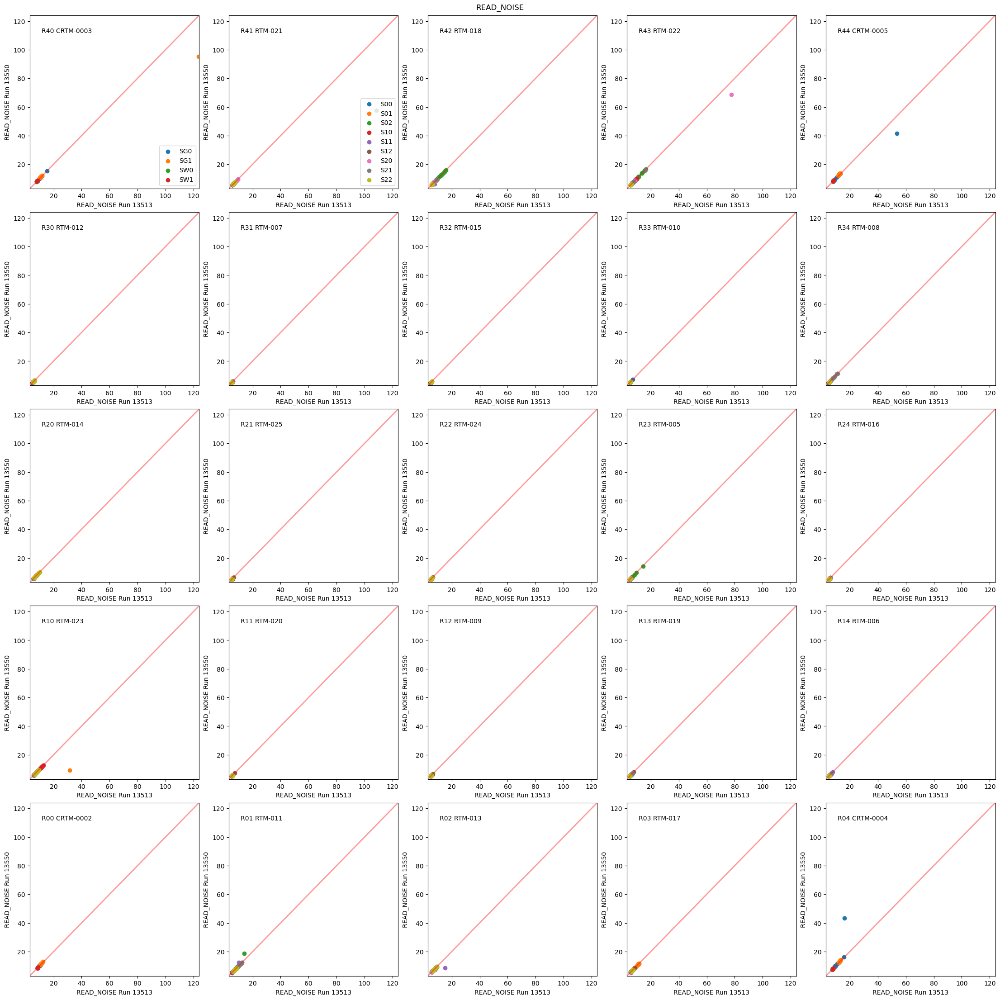

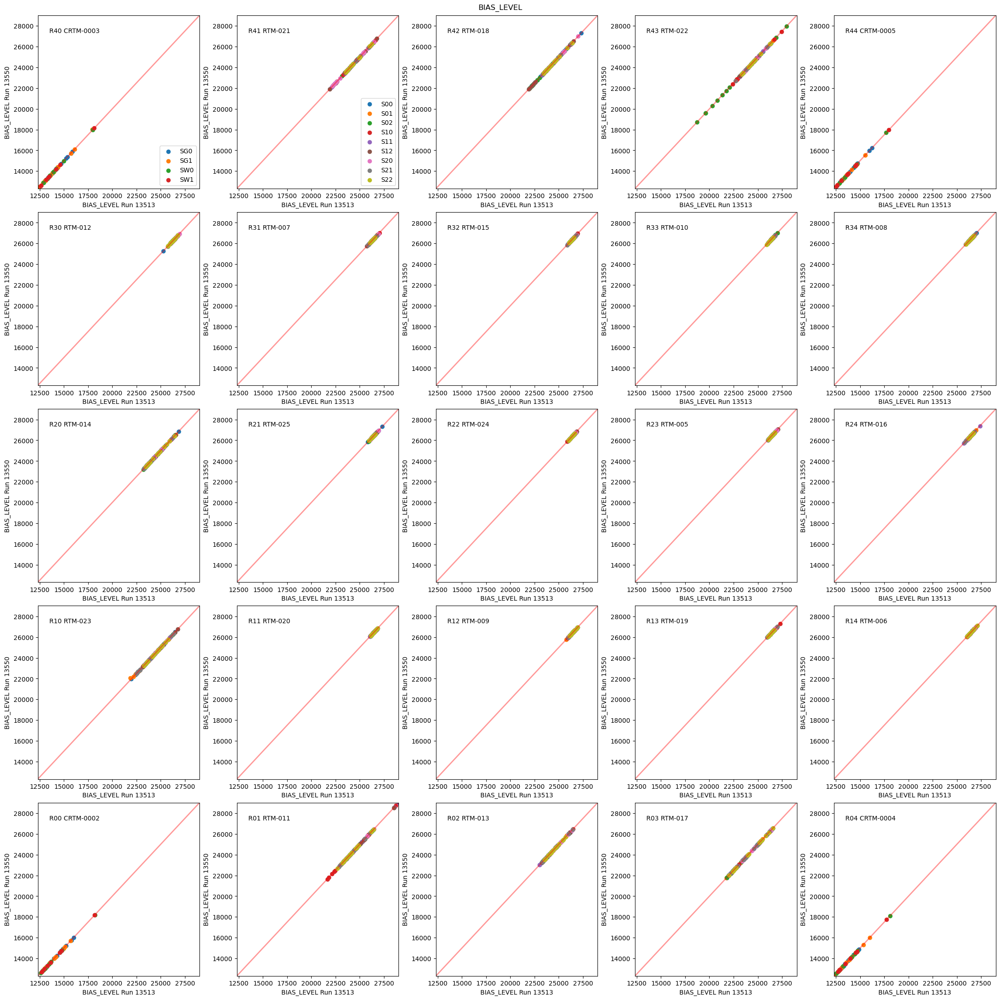

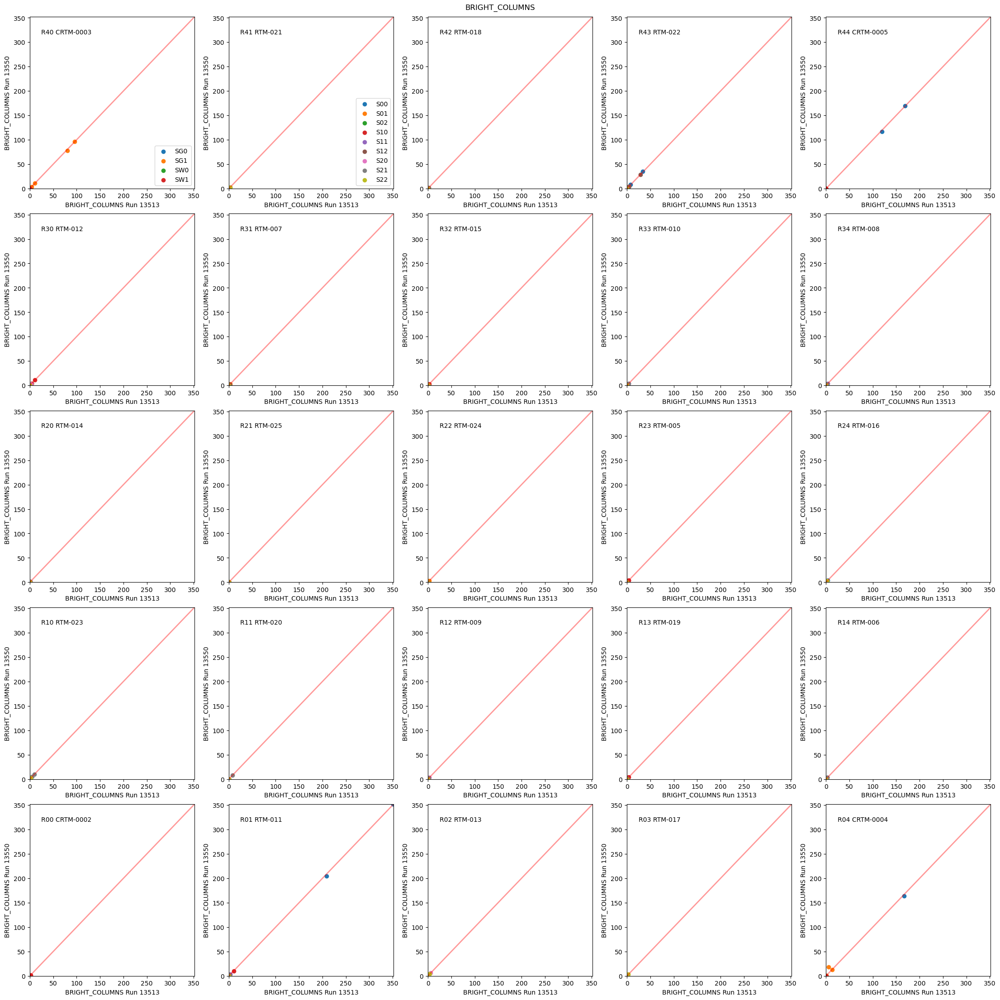

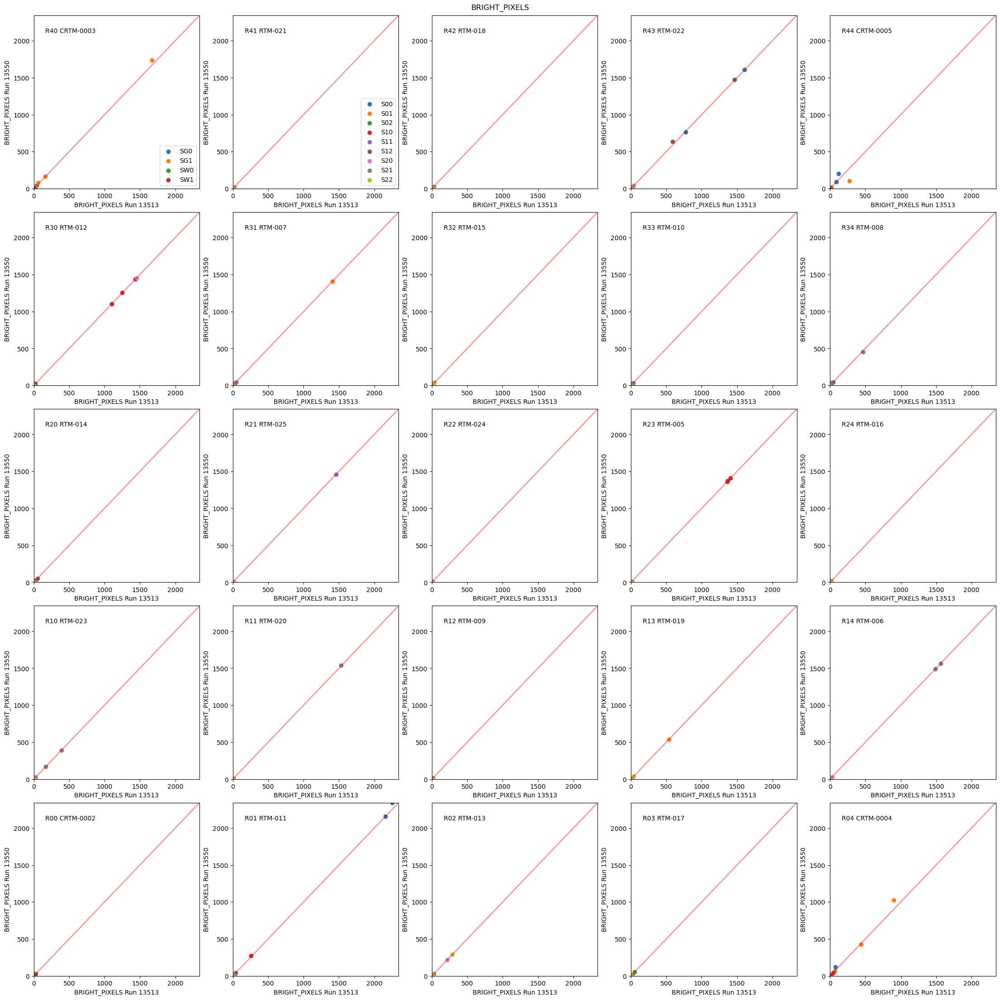

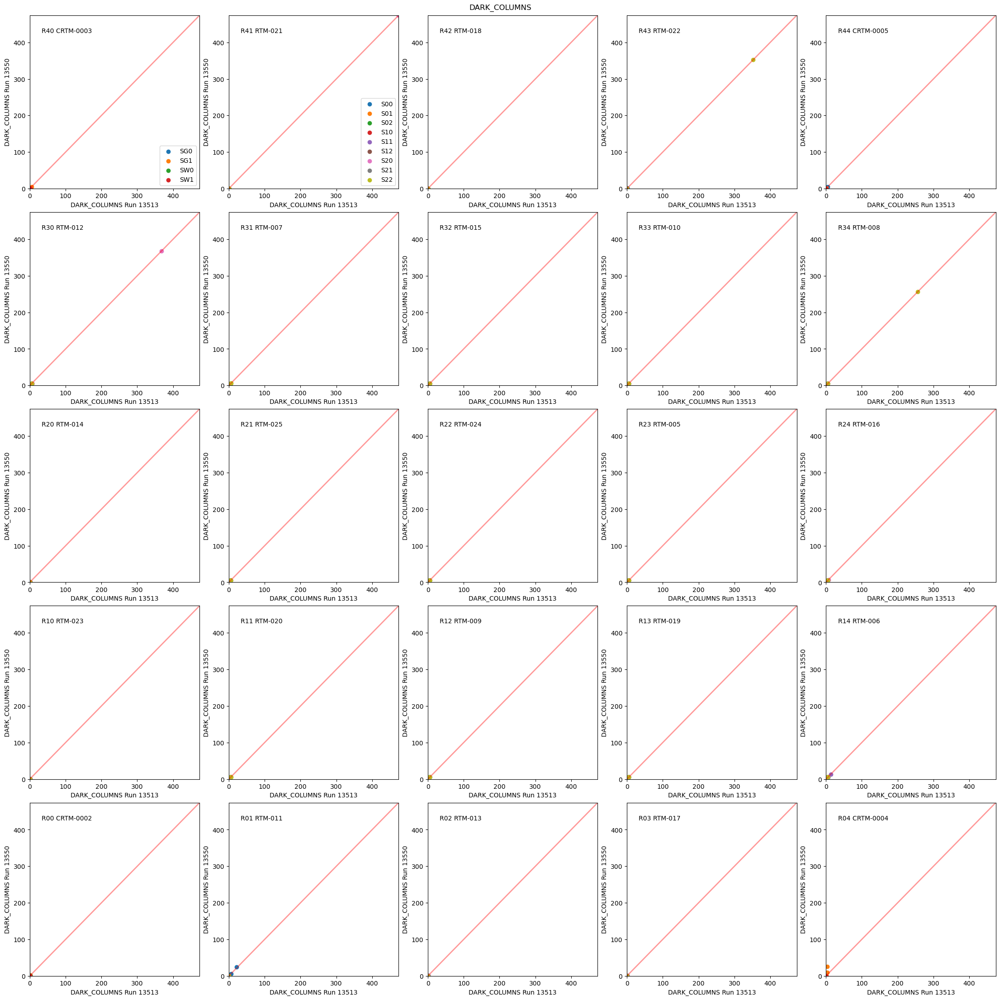

...

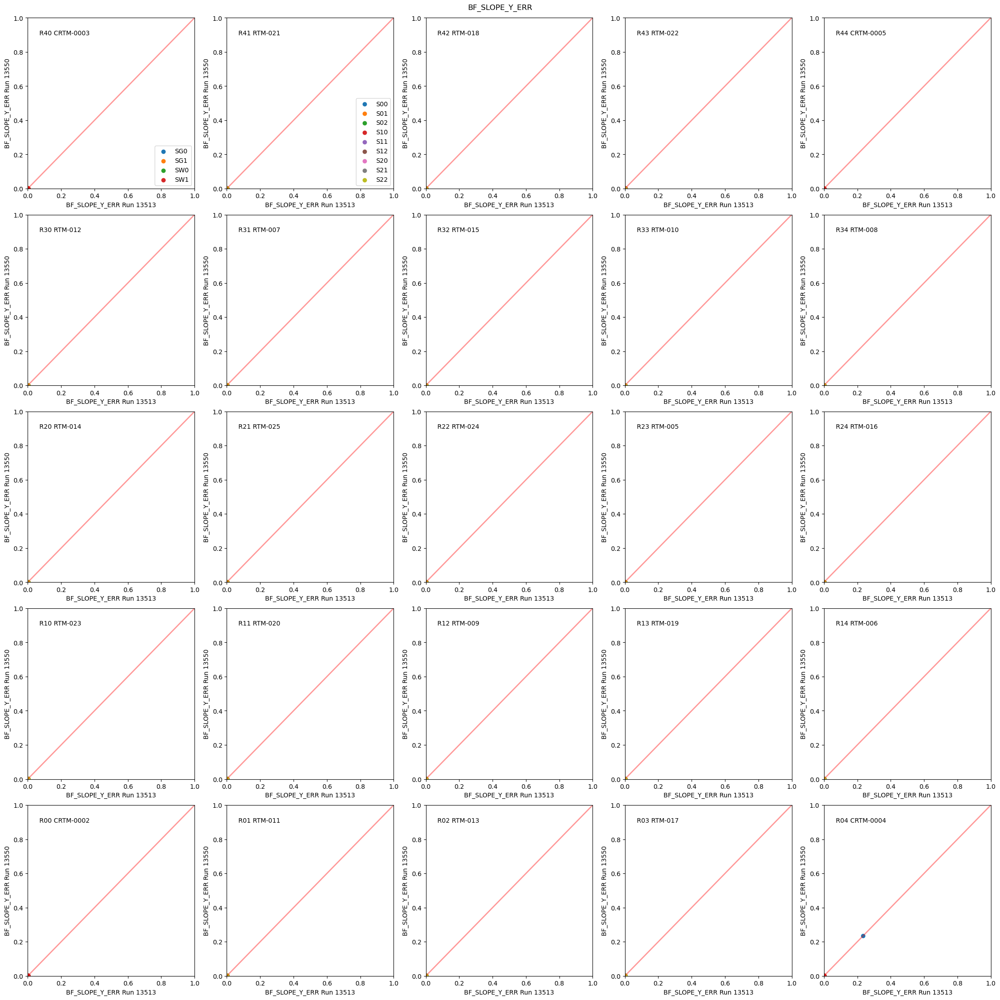

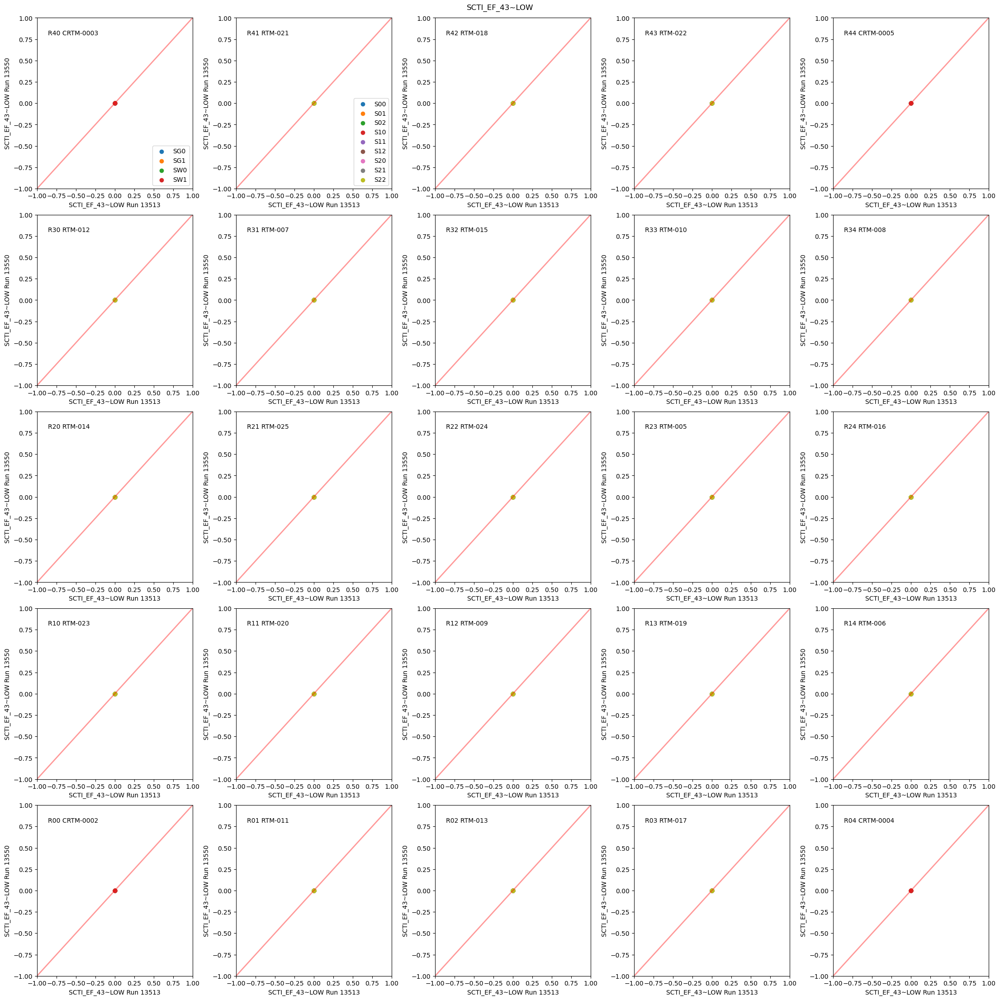

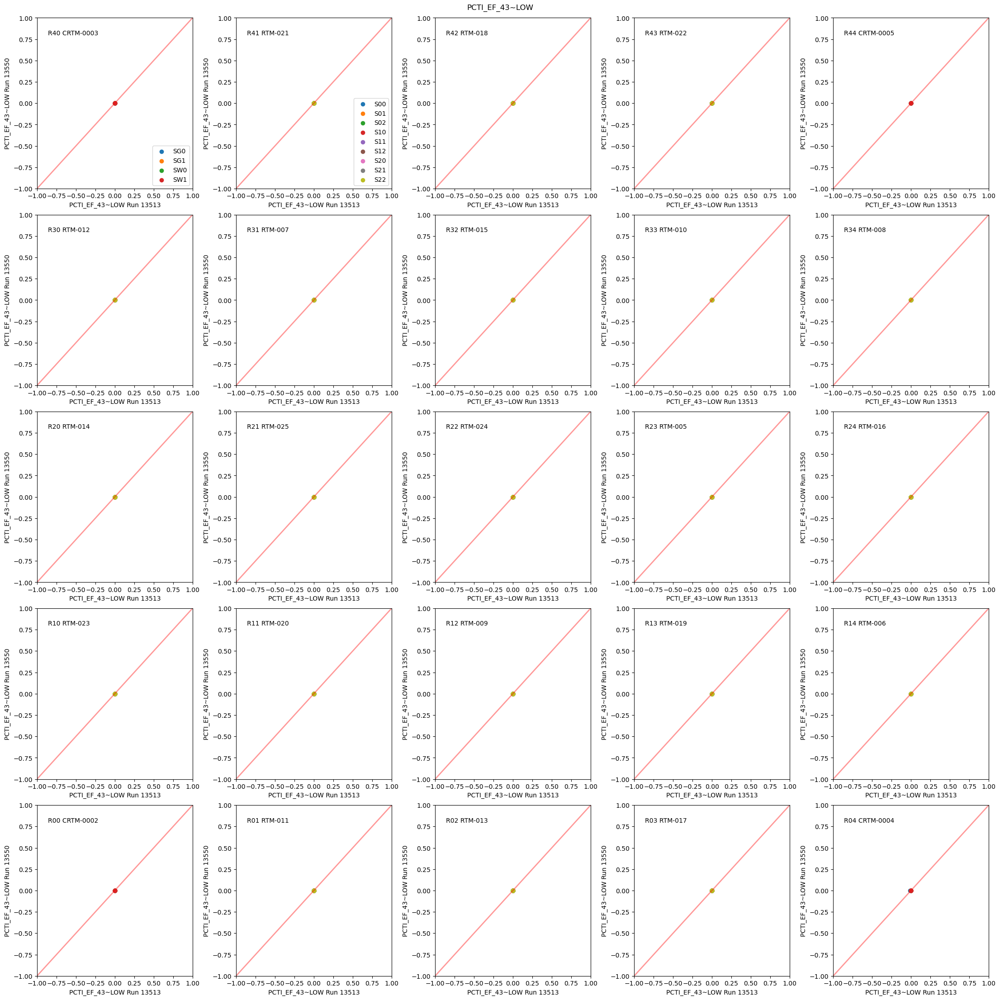

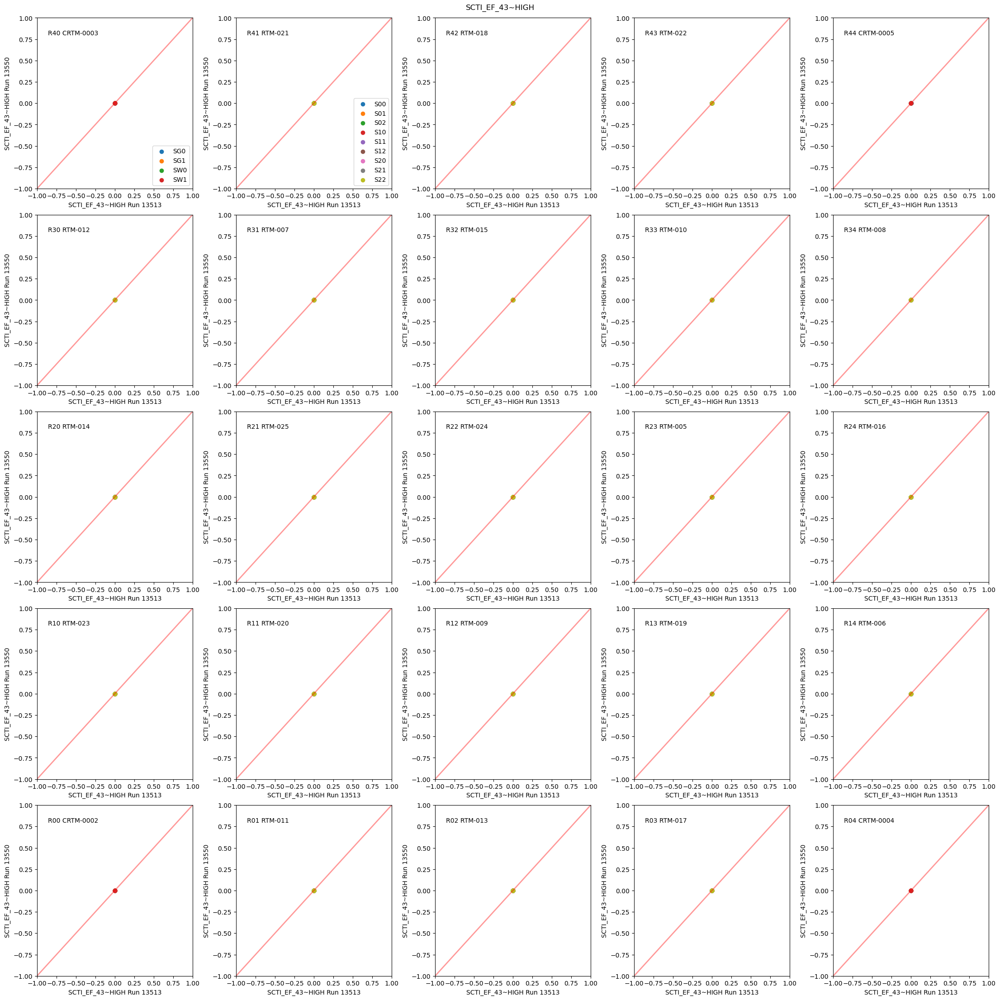

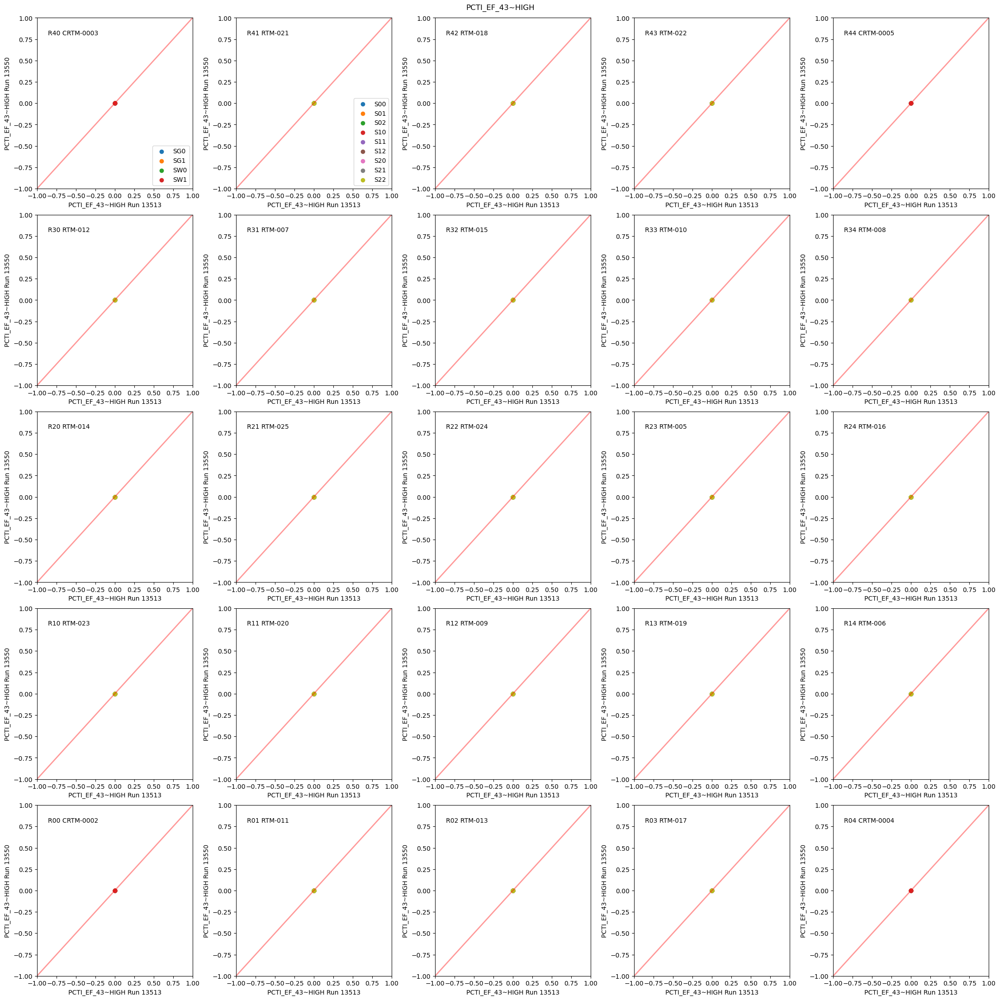

In [8]:
for col,ranges in zip(runQuantitydf.columns.values,list(rangeDict.values())):
    fig = compare_tworuns(df_base, df_run,f'{base}',f'{run}',quantity=col,minxy=np.floor(ranges[0]),maxxy=np.ceil(ranges[1]),title=col)
    # fig.savefig(f'{figBasePath}/{base}_{run}_{col}.png')
    showAndClear(fig)

## Individual comparison plots of eo_pipe values

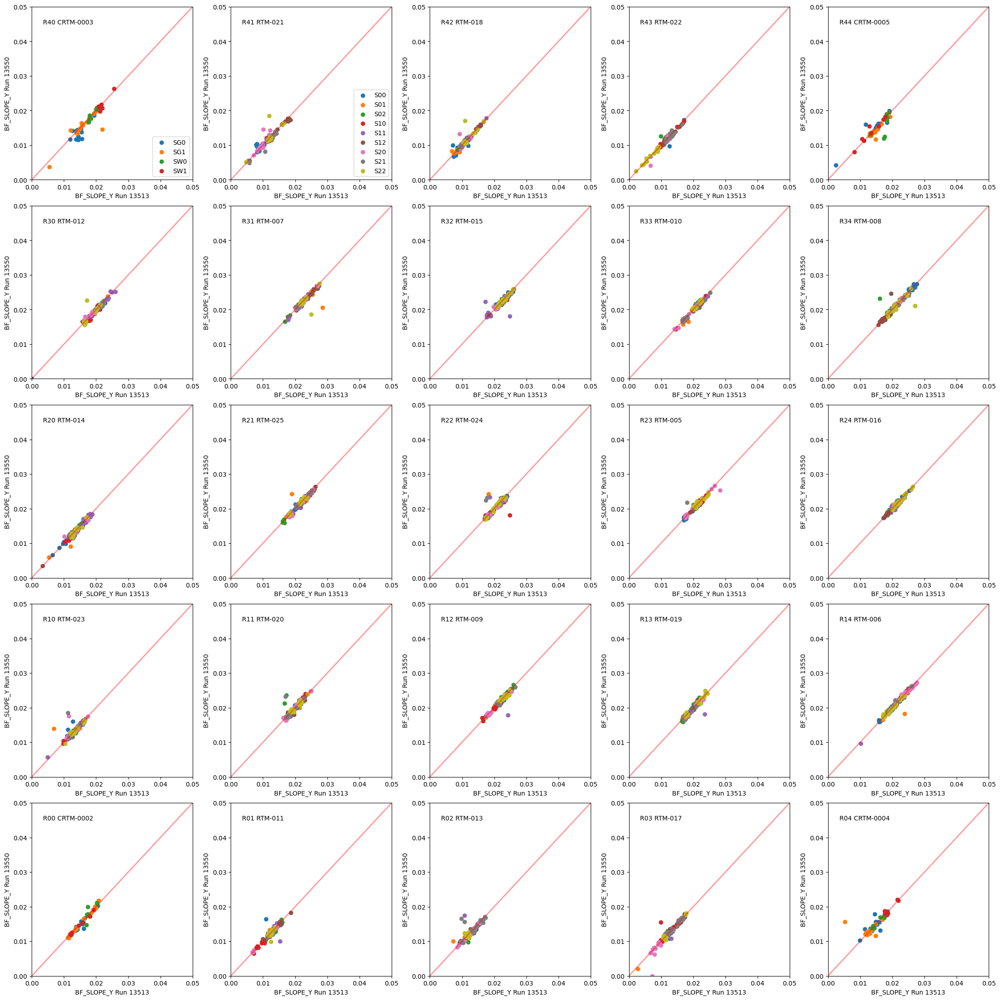

In [9]:
quantity = 'BF_SLOPE_Y'
compare_tworuns(df_base, df_run,f'{base}',f'{run}',quantity=quantity,minxy=0,maxxy=0.05)
# plt.savefig(f'{figBasePath}/{base}_{run}_{quantity}.png')
showAndClear(fig)

# Histograms of the all eo_pipe values with autoset ranges

In [10]:
n_bins = 30

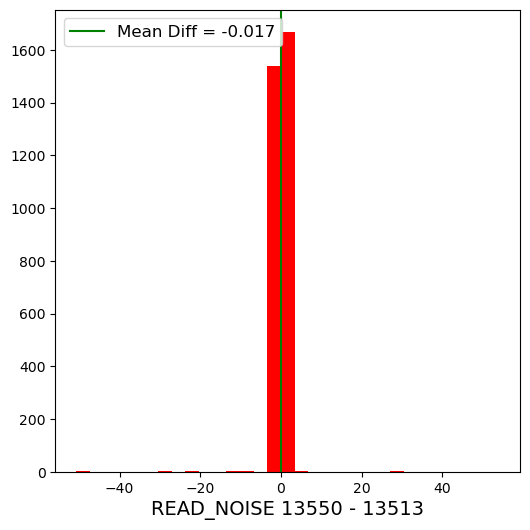

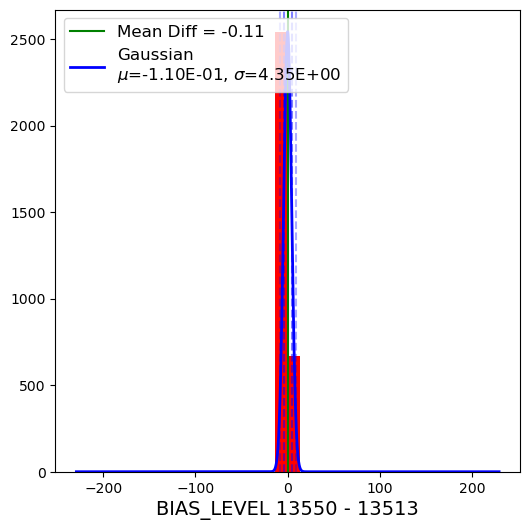

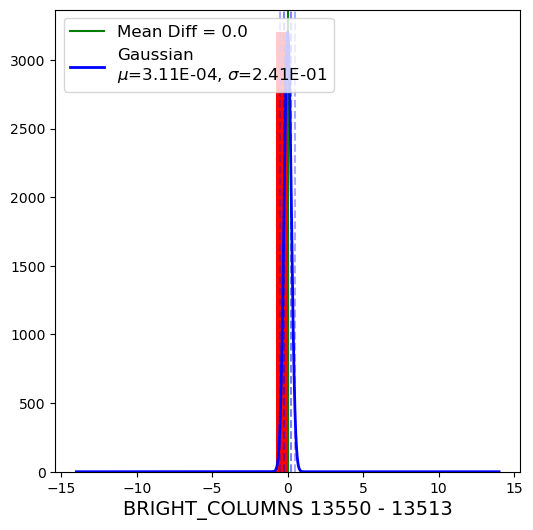

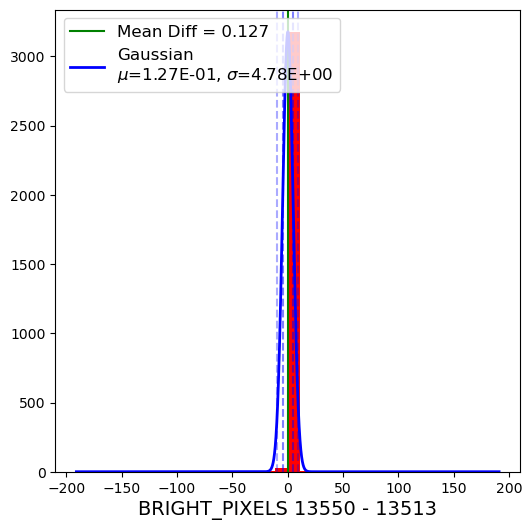

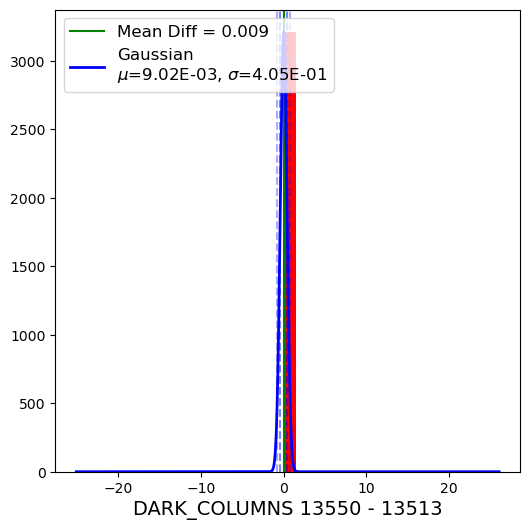

...

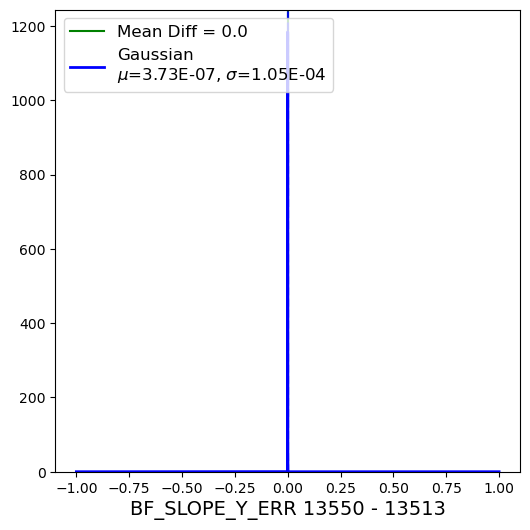

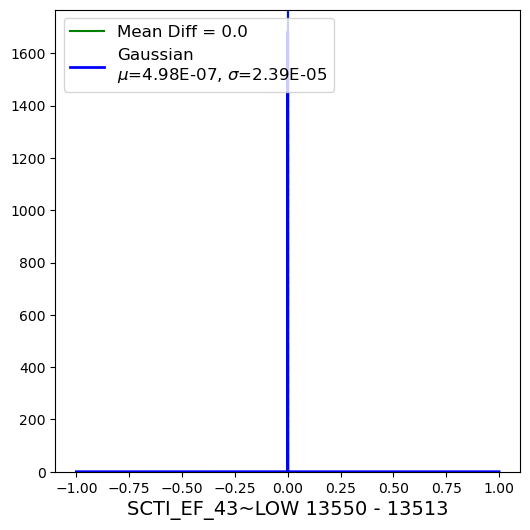

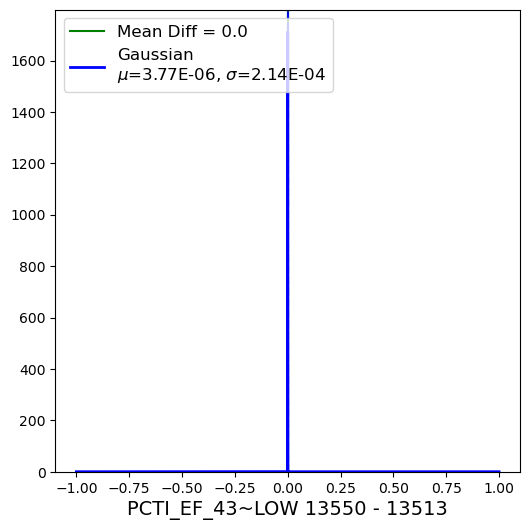

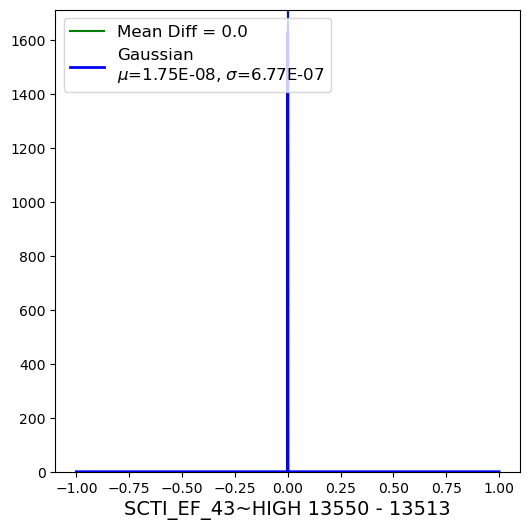

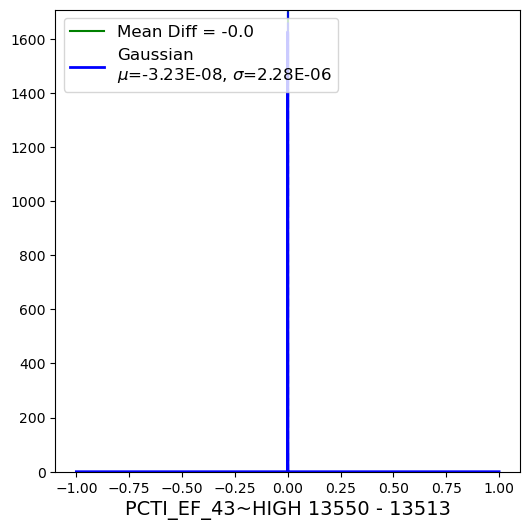

In [11]:
for col,ranges in zip(runQuantitydf.columns.values,list(rangeDict.values())):
    diff = df_run[col] - df_base[col]

    maxRange = np.max(np.abs(diff))
    fig,ax = plt.subplots(figsize=[6,6])
    n,bins,patches = ax.hist(diff, bins=np.arange(-maxRange, maxRange+2*maxRange/n_bins, step = 2*maxRange/n_bins),color='red',histtype='stepfilled');
    ax.axvline(x=np.mean(diff), c='green', label=f'Mean Diff = {np.around(np.mean(diff), decimals=3)}');

    if not diff.isna().any(): # Try to make a gaussian distribution
        try:
            mu,std,p,x,xmin,xmax = fitGaussian(diff,ax)
            p=(p/np.max(p)) * max(n)
            ax.plot(x, p,label="Gaussian\n$\mu$={:.2E}, $\sigma$={:.2E}".format(mu, std), linewidth=2,color="blue")
        
            for k in range(1,3):
                ax.axvline(x=mu+std*k,color='blue',ls='--',alpha = 1/(1+k))
                ax.axvline(x=mu-std*k,color='blue',ls='--',alpha = 1/(1+k))
        except:
            raise ValueError
    
    ax.legend(fontsize=12, loc=2)
    ax.set_xlabel(f'{col} {run} - {base}', fontsize=14)
    # fig.savefig(f'{figBasePath}/{col}_{base}_{run}_diff.png')
    showAndClear(fig)

### Individual histogram plots with quantities and ranges specified

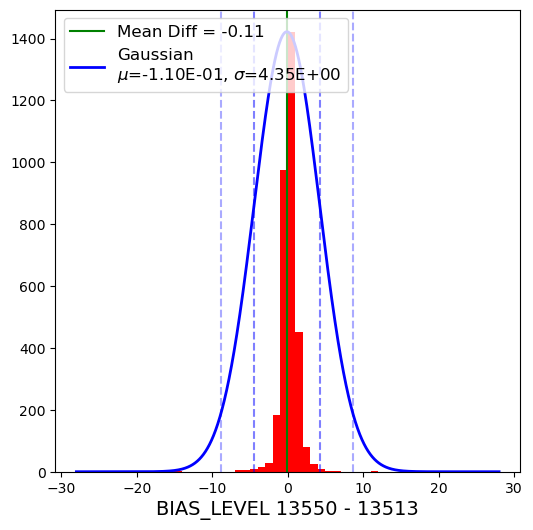

In [12]:
col = "BIAS_LEVEL"
maxRange = 25
n_bins = 50

diff = df_run[col] - df_base[col]

fig,ax = plt.subplots(figsize=[6,6])
n,bins,patches = ax.hist(diff, bins=np.arange(-maxRange, maxRange+2*maxRange/n_bins, step = 2*maxRange/n_bins),color='red',histtype='stepfilled');
ax.axvline(x=np.mean(diff), c='green', label=f'Mean Diff = {np.around(np.mean(diff), decimals=3)}');

if not diff.isna().any(): # Try to make a gaussian distribution
    try:
        mu,std,p,x,xmin,xmax = fitGaussian(diff,ax)
        p=(p/np.max(p)) * max(n)
        ax.plot(x, p,label="Gaussian\n$\mu$={:.2E}, $\sigma$={:.2E}".format(mu, std), linewidth=2,color="blue")
    
        for k in range(1,3):
            ax.axvline(x=mu+std*k,color='blue',ls='--',alpha = 1/(1+k))
            ax.axvline(x=mu-std*k,color='blue',ls='--',alpha = 1/(1+k))
    except:
        raise ValueError

ax.legend(fontsize=12, loc=2)
ax.set_xlabel(f'{col} {run} - {base}', fontsize=14)
# fig.savefig(f'{figBasePath}/{col}_{base}_{run}_diff.png')
showAndClear(fig)

## Study outliers in individual eo_pipe outputs

In [13]:
print(runQuantitydf.columns.values)

['READ_NOISE' 'BIAS_LEVEL' 'BRIGHT_COLUMNS' 'BRIGHT_PIXELS' 'DARK_COLUMNS'
 'DARK_PIXELS' 'DARK_CURRENT_95' 'DARK_CURRENT_MEDIAN'
 'DIVISADERO_TEARING' 'PTC_NOISE' 'PTC_TURNOFF' 'PTC_A00' 'PTC_GAIN'
 'ROW_MEAN_VAR_SLOPE' 'MAX_FRAC_DEV' 'MAX_OBSERVED_SIGNAL'
 'LINEARITY_TURNOFF' 'BF_XCORR' 'BF_YCORR' 'BF_MEAN' 'BF_SLOPE_X'
 'BF_SLOPE_X_ERR' 'BF_SLOPE_Y' 'BF_SLOPE_Y_ERR' 'SCTI_EF_43~LOW'
 'PCTI_EF_43~LOW' 'SCTI_EF_43~HIGH' 'PCTI_EF_43~HIGH']


In [14]:
quantity = 'READ_NOISE'
thresh = 18
print_diff(df_base, df_run, f'{base}', f'{run}', 
           quantity, thresh, change_thresh = 0.2, print_large_change=True)

BAY_SLOT,SEGMENT
R01_S02,C07
R01_S11,C00
R02_S11,C06
R04_SG0,C11
R10_S01,C03
R40_SG1,C10
R41_S21,C02
R42_S11,C05
R43_S20,C14
R44_SG0,C02


## alternative query - extra, hopefully not needed

In [15]:
# # Run 6 data
# runnum = 13421
# weekly = 41
# repo = '/repo/ir2'

# names = ['u/lsstccs/eo_dark_current_%d_w_2023_%d'%(runnum,weekly)]
# print(names)

# collections = [aname for aname in names]

# amp_data_13401 = {}
# amp_data_13401.update(readNoiseTask.get_amp_data(repo, collections))
# amp_data_13401.update(darkCurrentTask.get_amp_data(repo, collections))

# df_13401 = eopipe_DictToDfz(amp_data_13401)

# print(df_13401.columns)

In [16]:
# 


# baseQuantities = np.array(['READ_NOISE', 'BIAS_LEVEL', 'DIVISADERO_TEARING', 'PTC_TURNOFF','PTC_A00', 'PTC_GAIN', 'PTC_NOISE', 'ROW_MEAN_VAR_SLOPE','MAX_FRAC_DEV', 'MAX_OBSERVED_SIGNAL', 'LINEARITY_TURNOFF','BF_XCORR', 'BF_YCORR', 'BF_MEAN', 'BF_SLOPE_X', 'BF_SLOPE_X_ERR','BF_SLOPE_Y', 'BF_SLOPE_Y_ERR'])

# try:
#     if (allQuantities==baseQuantities).all():
#         print("baseQuantities is populated")
# except ValueError:
#     print("allQuantities does not match baseQuantities:")
#     print("allQuantities: {}".format(allQuantities))
#     print("baseQuantities: {}".format(baseQuantities))